In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import matplotlib as mpl
import numpy as np
from scipy.interpolate import interp1d
import re
mpl.rcParams['svg.fonttype'] = 'none'
from scipy.optimize import root_scalar
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import glob
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import gaussian_kde

## 데이터전처리

In [4]:
df_weather = pd.read_csv("weather_transformed.csv")

print(df_weather.columns.tolist())


['Date', 'Time', 'T', 'Td', 'Hr', 'Tmax', 'Tmin', 'ddd', 'ff', 'Gust', 'P0', 'P sea', 'P', 'Prec', 'N', 'N.1', 'H', 'Inso', 'Vis', 'WW', 'W1', 'W2', 'Hour']


In [5]:
df_weather["T"] = pd.to_numeric(df_weather["T"], errors="coerce")
df_weather["ff"] = pd.to_numeric(df_weather["ff"], errors="coerce")

In [6]:
# Hour → 숫자로 변환 (변환 불가는 NaN)
df_weather["Hour"] = pd.to_numeric(df_weather["Hour"], errors="coerce")

# NaN 값 제거
df_weather = df_weather.dropna(subset=["Hour"])

# int 변환
df_weather["Hour"] = df_weather["Hour"].astype(int)

# Date를 datetime으로 변환
df_weather["Date"] = pd.to_datetime(df_weather["Date"], errors="coerce")

# Datetime 생성: "20250731 13"
df_weather["Datetime"] = df_weather["Date"].dt.strftime("%Y%m%d") + " " + df_weather["Hour"].astype(str)

df_weather["Weekday"] = df_weather["Date"].dt.weekday  

# 주말 여부 (토=5, 일=6 → True)
df_weather["IsWeekend"] = df_weather["Weekday"].isin([5, 6])

print(df_weather[["Date", "Hour", "Datetime", "Weekday", "IsWeekend"]].head(100))

          Date  Hour     Datetime  Weekday  IsWeekend
1   2025-07-31    24  20250731 24        3      False
2   2025-07-31    23  20250731 23        3      False
3   2025-07-31    22  20250731 22        3      False
4   2025-07-31    21  20250731 21        3      False
5   2025-07-31    20  20250731 20        3      False
..         ...   ...          ...      ...        ...
97  2025-07-28     1   20250728 1        0      False
98  2025-07-27    24  20250727 24        6       True
99  2025-07-27    23  20250727 23        6       True
100 2025-07-27    22  20250727 22        6       True
101 2025-07-27    21  20250727 21        6       True

[100 rows x 5 columns]


C:\Users\symply_jina\AppData\Local\Temp\ipykernel_35248\803270465.py:11: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df_weather["Date"] = pd.to_datetime(df_weather["Date"], errors="coerce")


# 클러스터링

### 날씨로클러스터링

In [ ]:
# 클러스터링 1: 날씨
features = df_weather[["T", "ff", "Prec"]].replace("----", 0)
features = features.apply(pd.to_numeric, errors="coerce").fillna(0)

# 2. 정규화 (스케일 차이 보정)
scaler = StandardScaler()
X = scaler.fit_transform(features)

# 3. KMeans 클러스터링 (예: 5개 클러스터)
kmeans = KMeans(n_clusters=24, random_state=42)
df_weather["Cluster"] = kmeans.fit_predict(X)

plt.scatter(df_weather["T"], df_weather["ff"], c=df_weather["Cluster"], cmap="tab10")
plt.xlabel("Temperature (°C)")
plt.ylabel("Wind speed (km/h)")
plt.title("Weather-based Clustering")
plt.colorbar(label="Cluster")
plt.show()


In [ ]:
# 클러스터링 2: 날씨, 주말
features = df_weather[["T", "ff", "Prec"]].replace("----", 0)
features = features.apply(pd.to_numeric, errors="coerce").fillna(0)

# 주말 여부를 숫자형으로 추가 (0=평일, 1=주말)
features["IsWeekend"] = df_weather["IsWeekend"].astype(int)

# 2. 정규화 (스케일 차이 보정)
scaler = StandardScaler()
X = scaler.fit_transform(features)

# 3. KMeans 클러스터링 (예: 5개 클러스터)
kmeans = KMeans(n_clusters=24, random_state=42)
df_weather["Cluster"] = kmeans.fit_predict(X)

# 시각화 (기온-풍속 기준)
plt.scatter(df_weather["T"], df_weather["ff"], c=df_weather["Cluster"], cmap="tab10")
plt.xlabel("Temperature (°C)")
plt.ylabel("Wind speed (km/h)")
plt.title("Weather + Weekend-based Clustering")
plt.colorbar(label="Cluster")
plt.show()


In [ ]:
# 클러스터링 3: 날씨, 주말 분리
# 평일 / 주말 데이터 분리
df_weekday = df_weather[df_weather["IsWeekend"] == 0].copy()
df_weekend = df_weather[df_weather["IsWeekend"] == 1].copy()

# Feature 선택
features_weekday = df_weekday[["T", "ff", "Prec"]].replace("----", 0).apply(pd.to_numeric, errors="coerce").fillna(0)
features_weekend = df_weekend[["T", "ff", "Prec"]].replace("----", 0).apply(pd.to_numeric, errors="coerce").fillna(0)

# 정규화 + 클러스터링
scaler = StandardScaler()

X_weekday = scaler.fit_transform(features_weekday)
X_weekend = scaler.fit_transform(features_weekend)

kmeans_wd = KMeans(n_clusters=5, random_state=42)
kmeans_we = KMeans(n_clusters=5, random_state=42)

df_weekday["Cluster"] = kmeans_wd.fit_predict(X_weekday)
df_weekend["Cluster"] = kmeans_we.fit_predict(X_weekend)

# 다시 합치기
df_weather_clustered = pd.concat([df_weekday, df_weekend], ignore_index=True)

plt.figure(figsize=(8,6))

# 평일 (IsWeekend = 0)
weekday = df_weather[df_weather["IsWeekend"] == 0]
plt.scatter(
    weekday["T"], weekday["ff"], 
    c=weekday["Cluster"], cmap="tab10", marker="o", alpha=0.6, label="Weekday"
)

# 주말 (IsWeekend = 1)
weekend = df_weather[df_weather["IsWeekend"] == 1]
plt.scatter(
    weekend["T"], weekend["ff"], 
    c=weekend["Cluster"], cmap="tab10", marker="s", alpha=0.9, label="Weekend"
)

plt.xlabel("Temperature (°C)")
plt.ylabel("Wind speed (km/h)")
plt.title("Weather + Weekend Clustering")
plt.legend()
plt.colorbar(label="Cluster")
plt.show()


### 수요예측으로 클러스터링

In [7]:
file_path = "demandforecast0903.xls"

# 1. HTML로 읽기 시도
try:
    dfs = pd.read_html(file_path)
    read_type = "html"
    df_forecast = dfs[0]
except Exception as e_html:
    # 2. CSV로 읽기 시도
    try:
        df_forecast = pd.read_csv(file_path)
        read_type = "csv"
    except Exception as e_csv:
        df_forecast = None
        read_type = f"fail: {e_csv}"

(read_type, df_forecast.head() if df_forecast is not None else None)


('html',
       0                          1      2        3          4  \
 0    id                       name  geoid  geoname      value   
 1  1775  Demand D+1 daily forecast    NaN      NaN  37552.500   
 2  1775  Demand D+1 daily forecast    NaN      NaN  37571.800   
 3  1775  Demand D+1 daily forecast    NaN      NaN  37861.000   
 4  1775  Demand D+1 daily forecast    NaN      NaN  37543.000   
 
                            5  
 0                   datetime  
 1  2025-06-30T17:00:00+02:00  
 2  2025-06-30T18:00:00+02:00  
 3  2025-06-30T19:00:00+02:00  
 4  2025-06-30T20:00:00+02:00  )

In [8]:
# 1. 컬럼 정리 (첫 행이 컬럼명이면 이 과정 필요)
df_forecast.columns = df_forecast.iloc[0]   # 첫 번째 행을 컬럼명으로
df_forecast = df_forecast.drop(0).reset_index(drop=True)

# 2. datetime 처리
df_forecast["datetime"] = pd.to_datetime(df_forecast["datetime"], errors="coerce")

# 3. Date와 Hour 분리
df_forecast["Date"] = df_forecast["datetime"].dt.strftime("%Y%m%d")   # YYYYMMDD 문자열
df_forecast["Hour"] = df_forecast["datetime"].dt.hour + 1             # 0~23 → 1~24

# 4. Datetime: "20250701 1" 형태로
df_forecast["Datetime"] = df_forecast["Date"] + " " + df_forecast["Hour"].astype(str)

# 5. value를 숫자로 변환
df_forecast["value"] = pd.to_numeric(df_forecast["value"], errors="coerce")

# 확인
print(df_forecast[["Date", "Hour", "Datetime", "value"]].head(10))
print(df_forecast.dtypes)


0      Date  Hour     Datetime    value
0  20250630    18  20250630 18  37552.5
1  20250630    19  20250630 19  37571.8
2  20250630    20  20250630 20  37861.0
3  20250630    21  20250630 21  37543.0
4  20250630    22  20250630 22  37057.8
5  20250630    23  20250630 23  35464.8
6  20250630    24  20250630 24  32630.3
7  20250701     1   20250701 1  31178.3
8  20250701     2   20250701 2  29220.3
9  20250701     3   20250701 3  27816.3
0
id                             object
name                           object
geoid                          object
geoname                        object
value                         float64
datetime    datetime64[ns, UTC+02:00]
Date                           object
Hour                            int32
Datetime                       object
dtype: object


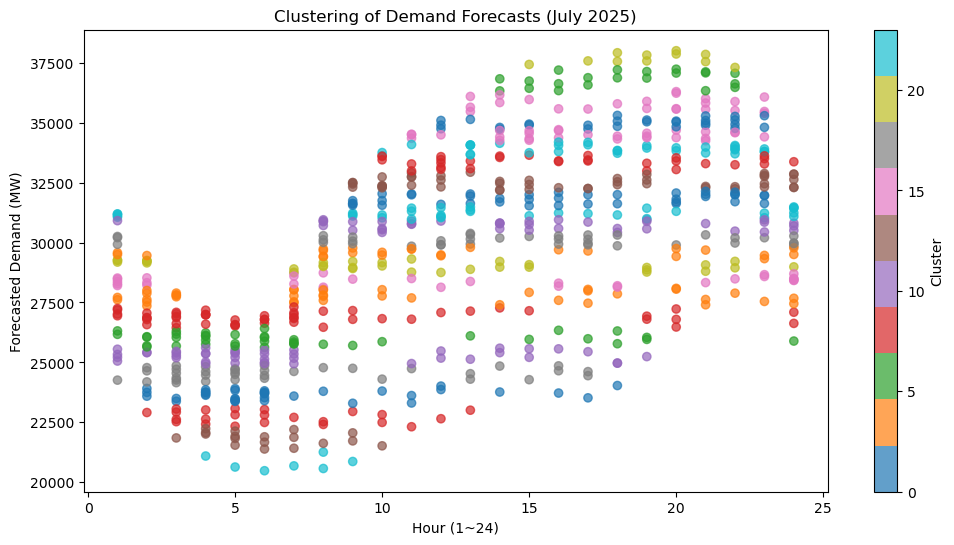

Cluster
0     34
1     39
2     28
3     39
4     25
5     39
6     21
7     23
8     31
9     51
10    38
11    42
12    18
13    47
14    30
15    23
16    28
17    37
18    36
19    33
20    11
21    31
22    33
23     7
Name: count, dtype: int64


In [9]:
# ===== 2. 클러스터링 피처 선택 =====
# 여기서는 단순히 수요 값만 사용 (원하면 Hour도 추가 가능)
features = df_forecast[["value"]].fillna(0)

# 정규화
scaler = StandardScaler()
X = scaler.fit_transform(features)

# ===== 3. KMeans 클러스터링 =====
kmeans = KMeans(n_clusters=24, random_state=42)
df_forecast["Cluster"] = kmeans.fit_predict(X)

# ===== 4. 시각화 =====
plt.figure(figsize=(12,6))
plt.scatter(df_forecast["Hour"], df_forecast["value"], 
            c=df_forecast["Cluster"], cmap="tab10", alpha=0.7)

plt.xlabel("Hour (1~24)")
plt.ylabel("Forecasted Demand (MW)")
plt.title("Clustering of Demand Forecasts (July 2025)")
plt.colorbar(label="Cluster")
plt.show()

# ===== 5. 클러스터별 개수 확인 =====
print(df_forecast["Cluster"].value_counts().sort_index())


### 날씨 수요예측 합쳐서 클러스터링

병합된 데이터:   Date_weather      Time     T    Td  Hr   Tmax   Tmin  ddd    ff   Gust  ...  \
0   2025-07-31  16:00:00  35.3   9.4  21  -----  -----  SSW  11.1    948  ...   
1   2025-07-31  15:00:00  34.3   9.7  22  -----  -----   NW   7.4  948.5  ...   
2   2025-07-31  14:00:00  34.2   9.8  22  -----  -----    W  13.0  949.1  ...   
3   2025-07-31  13:00:00  33.7  11.4  26  -----  -----    S  11.1  949.9  ...   
4   2025-07-31  12:00:00  31.5  13.4  33  -----  -----   SW   9.3  950.7  ...   

  IsWeekend    id                       name geoid geoname    value  \
0     False  1775  Demand D+1 daily forecast   NaN     NaN  29903.0   
1     False  1775  Demand D+1 daily forecast   NaN     NaN  29933.8   
2     False  1775  Demand D+1 daily forecast   NaN     NaN  30515.8   
3     False  1775  Demand D+1 daily forecast   NaN     NaN  30579.5   
4     False  1775  Demand D+1 daily forecast   NaN     NaN  30144.5   

                   datetime Date_forecast Hour_forecast  Cluster  
0 2025-07-

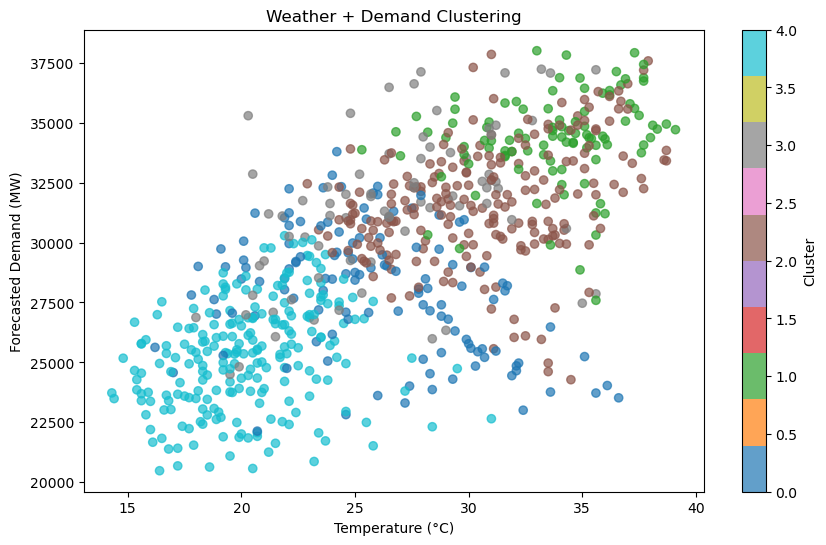

Cluster
0    126
1    100
2    214
3     74
4    223
Name: count, dtype: int64


In [23]:
# 1. df_weather + df_forecast 합치기
df_merged = pd.merge(df_weather, df_forecast, on="Datetime", how="inner", suffixes=("_weather", "_forecast"))

print("병합된 데이터:", df_merged.head())

# 2. 클러스터링 피처 선택 (날씨 + 수요)
features = df_merged[["T", "ff", "Prec", "value"]].replace("----", 0)
features = features.apply(pd.to_numeric, errors="coerce").fillna(0)

# 3. 정규화
scaler = StandardScaler()
X = scaler.fit_transform(features)

# 4. KMeans (예: 5개 클러스터)
kmeans = KMeans(n_clusters=5, random_state=42)
df_merged["Cluster"] = kmeans.fit_predict(X)

# 5. 시각화 (온도 vs 수요, 색깔=클러스터)
plt.figure(figsize=(10,6))
plt.scatter(df_merged["T"], df_merged["value"], 
            c=df_merged["Cluster"], cmap="tab10", alpha=0.7)

plt.xlabel("Temperature (°C)")
plt.ylabel("Forecasted Demand (MW)")
plt.title("Weather + Demand Clustering")
plt.colorbar(label="Cluster")
plt.show()

# 클러스터별 개수 확인
print(df_merged["Cluster"].value_counts().sort_index())


# 클러스터링 to Curve

In [10]:
files = glob.glob("filteredcurve_202507*.csv")
df_list = []
for fn in files:
    temp = pd.read_csv(fn, encoding="utf-8-sig")

    # 파일명에서 날짜 추출
    date_str = fn.split("_")[-1].split(".")[0]   # "20250720"
    temp["Date"] = pd.to_datetime(date_str, format="%Y%m%d")

    # 공급곡선의 Period → Hour 변환 (1~24 → 0~23)
    temp = temp.dropna(subset=["Time Period"])
    temp["Hour"] = temp["Time Period"].astype(int)

    # Datetime 만들기 (같은 포맷: "20250720 0")
    temp["Datetime"] = temp["Date"].dt.strftime("%Y%m%d") + " " + temp["Hour"].astype(str)

    df_list.append(temp)

df_supply = pd.concat(df_list, ignore_index=True)

print(df_supply[["Date", "Hour", "Datetime"]].head())


        Date  Hour    Datetime
0 2025-07-01     1  20250701 1
1 2025-07-01     1  20250701 1
2 2025-07-01     1  20250701 1
3 2025-07-01     1  20250701 1
4 2025-07-01     1  20250701 1


Cluster
0    121
1    100
2    193
3     74
4    208
Name: count, dtype: int64


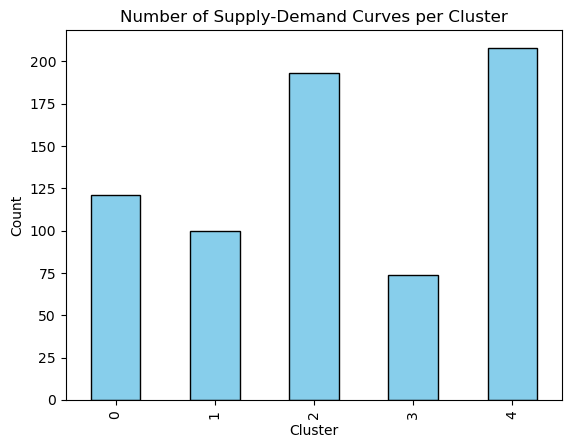

In [24]:
supply_curves = []

# ① Datetime → Cluster 매핑 dict 만들기
# cluster_map = dict(zip(df_forecast["Datetime"], df_forecast["Cluster"]))
cluster_map = dict(zip(df_merged["Datetime"], df_merged["Cluster"]))

# ② 공급곡선 + 수요곡선 생성
for (date, hour), sub in df_supply.groupby(["Date", "Hour"]):
    sup = sub[sub["GC"] == "V"].copy()   # 공급
    dem = sub[sub["GC"] == "C"].copy()   # 수요
    if sup.empty or dem.empty:
        continue
    
    # 공급곡선 집계
    s_agg = sup.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
    s_agg["Cumul"] = s_agg["Amount"].cumsum()
    
    # 수요곡선 집계
    d_agg = dem.groupby("Price")["Amount"].sum().reset_index().sort_values("Price")
    d_agg["Cumul"] = d_agg["Amount"][::-1].cumsum()[::-1]
    
    # Datetime (앞에서 만든 포맷과 동일)
    dt = pd.to_datetime(date).strftime("%Y%m%d") + " " + str(hour)
    
    # 이 Datetime이 어떤 클러스터인지 확인
    cluster = cluster_map.get(dt, None)
    
    supply_curves.append({
        "Datetime": dt,
        "Cluster": cluster,
        "Supply": s_agg,
        "Demand": d_agg
    })

# 결과 확인
df_clusters = pd.DataFrame([{"Datetime": c["Datetime"], "Cluster": c["Cluster"]} for c in supply_curves])

# 클러스터별 개수 세기
cluster_counts = df_clusters["Cluster"].value_counts().sort_index()

print(cluster_counts)
cluster_counts.plot(kind="bar", color="skyblue", edgecolor="black")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.title("Number of Supply-Demand Curves per Cluster")
plt.show()


### 수요공급선

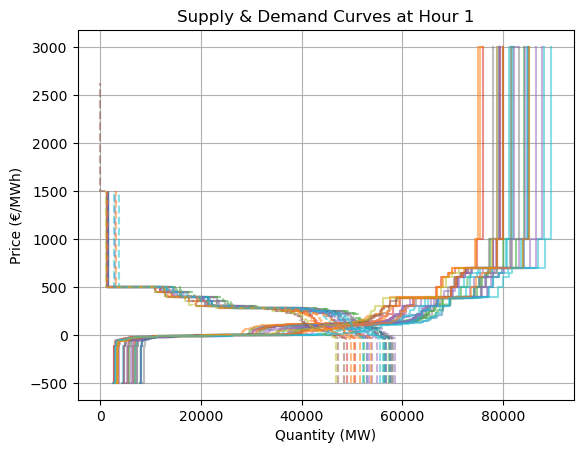

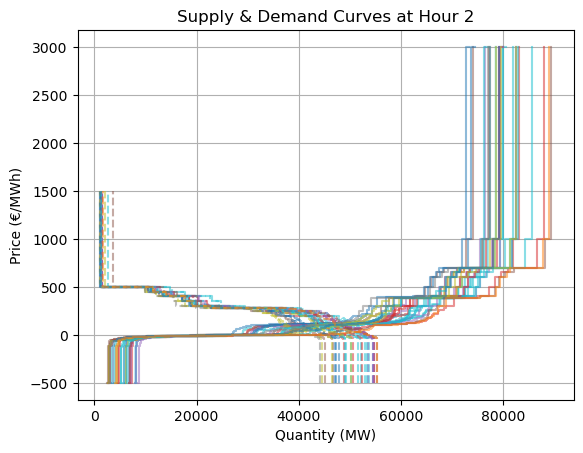

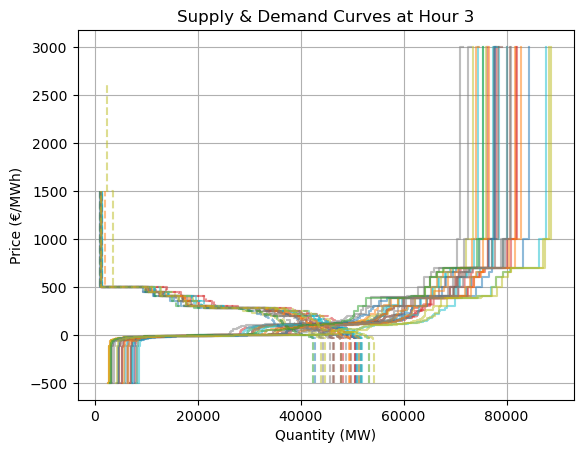

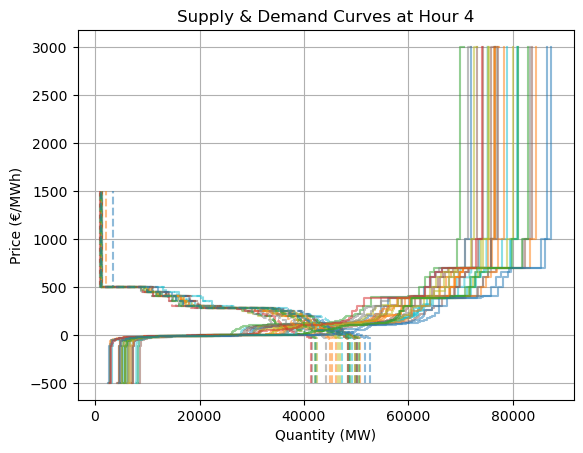

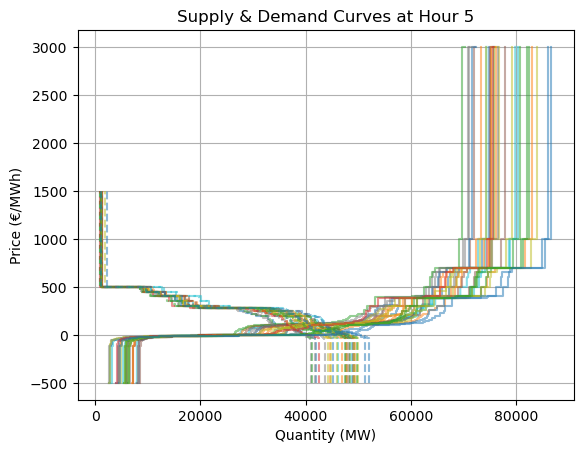

...

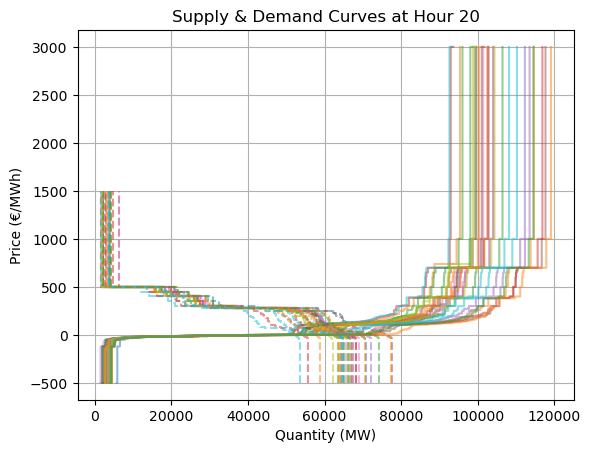

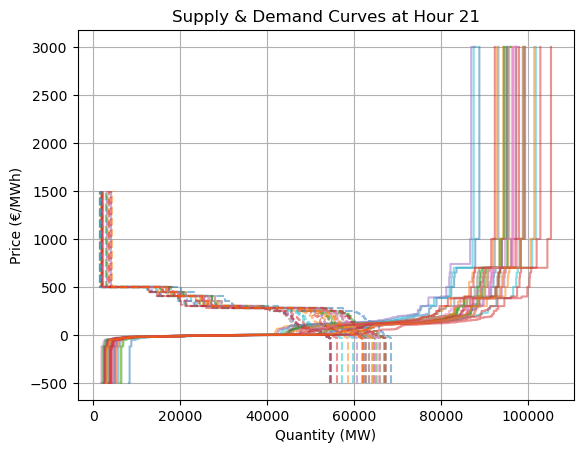

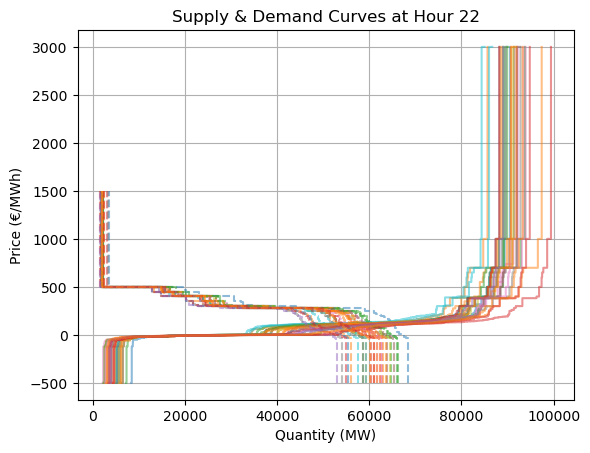

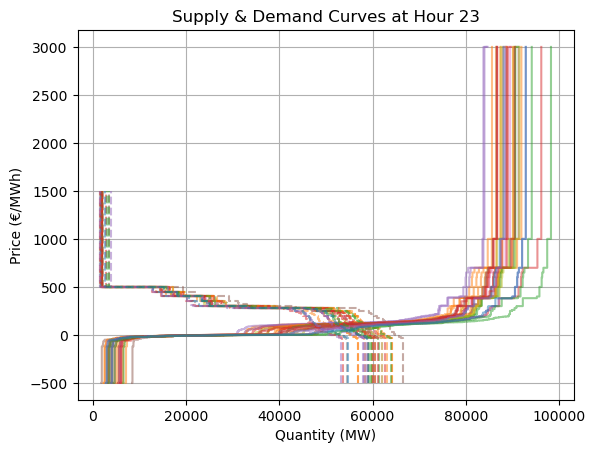

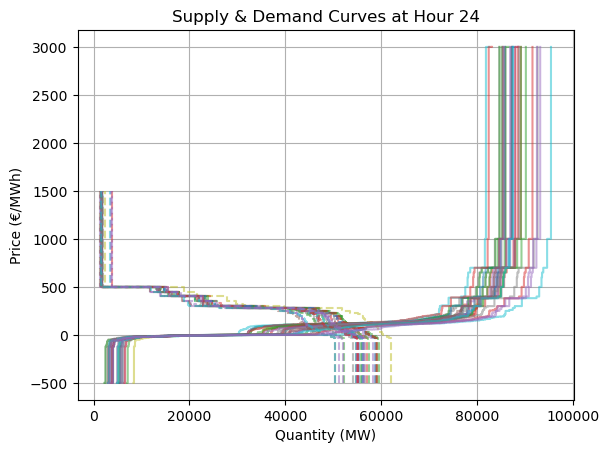

In [13]:
# import matplotlib.cm as cm

colors = cm.tab10

for h in range(1, 25):  # 1~24    plt.figure(figsize=(8,6))
    
    for curve in supply_curves:
        cluster = curve["Cluster"]
        if cluster is None:
            continue
        
        # Datetime에서 Hour 추출
        hour = int(curve["Datetime"].split()[-1])
        if hour != h:
            continue
        
        # 공급곡선 (실선)
        plt.step(
            curve["Supply"]["Cumul"], curve["Supply"]["Price"],
            where="post", color=colors(cluster % 10), alpha=0.5
        )
        
        # 수요곡선 (점선)
        plt.step(
            curve["Demand"]["Cumul"], curve["Demand"]["Price"],
            where="post", color=colors(cluster % 10), linestyle="--", alpha=0.5
        )
    
    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.title(f"Supply & Demand Curves at Hour {h}")
    plt.grid(True)
    plt.show()


### RDC

In [14]:
def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
    rdc = []
    for q in wf_offers:
        resid = demand_vals - supply_vals - q
        idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
        for i in idx:
            p0,p1 = price_grid[i], price_grid[i+1]
            r0,r1 = resid[i],       resid[i+1]
            if r1 != r0:
                # 선형 보간으로 교차점 계산
                p_star = p0 - r0*(p1-p0)/(r1-r0)
                rdc.append((q, p_star))
    return rdc


### 시간별 RDC

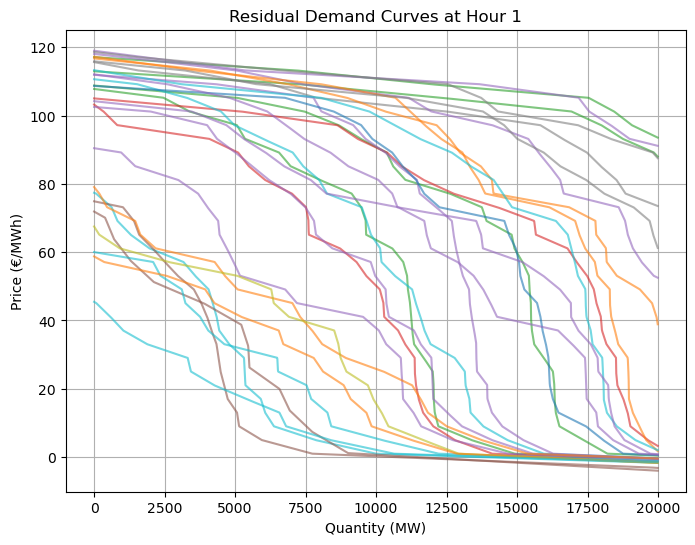

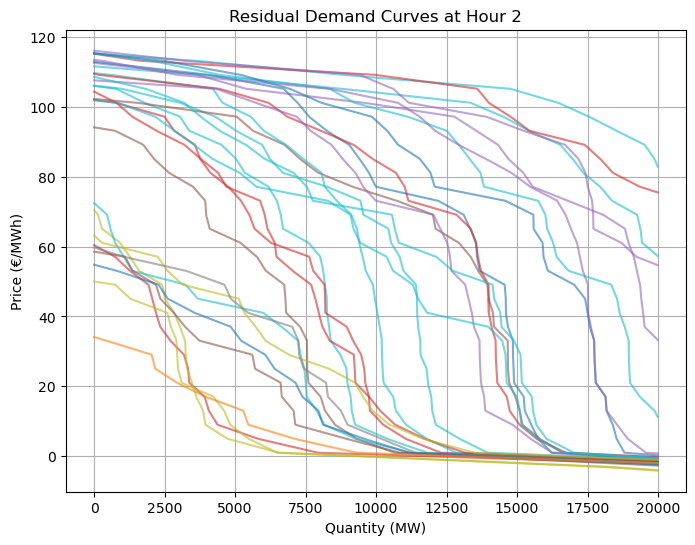

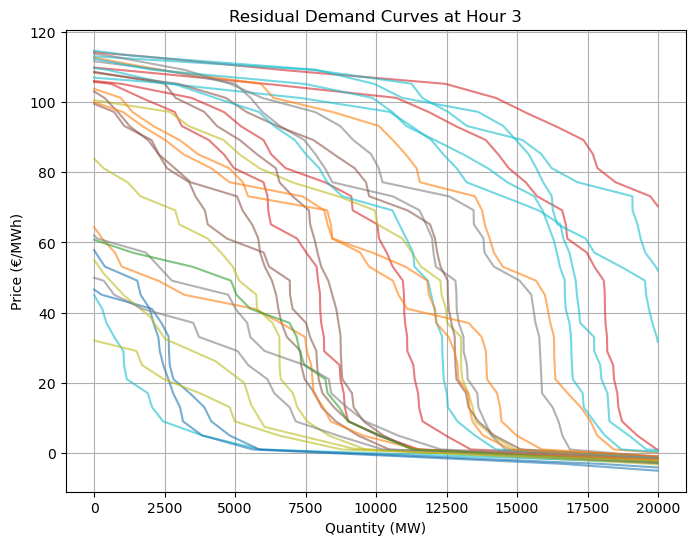

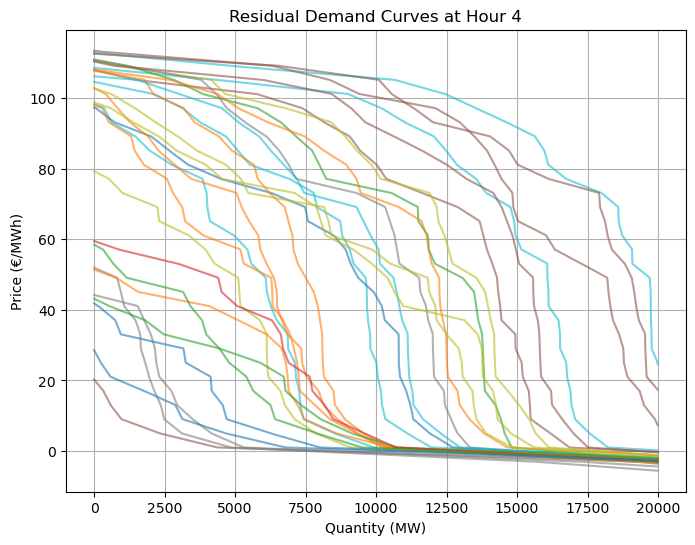

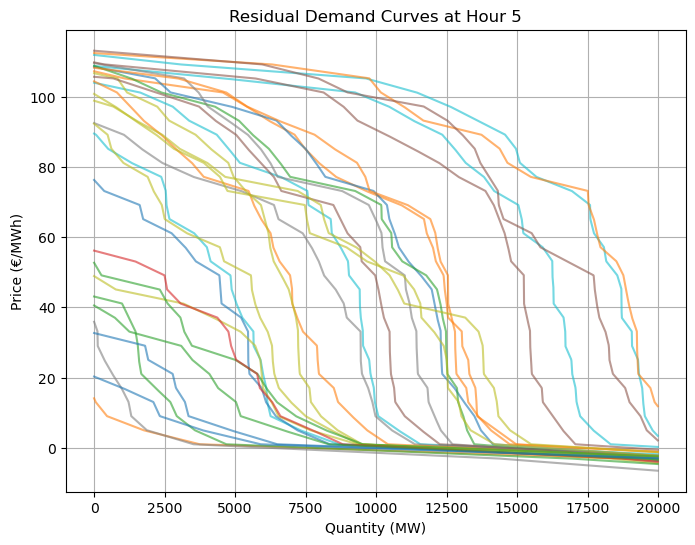

...

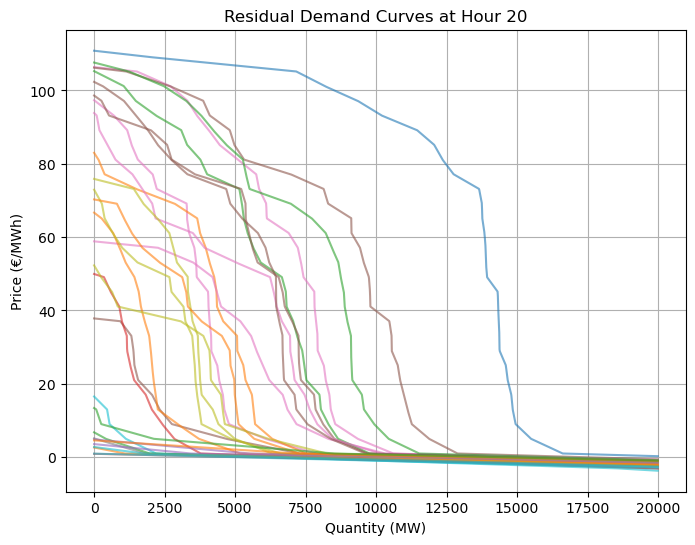

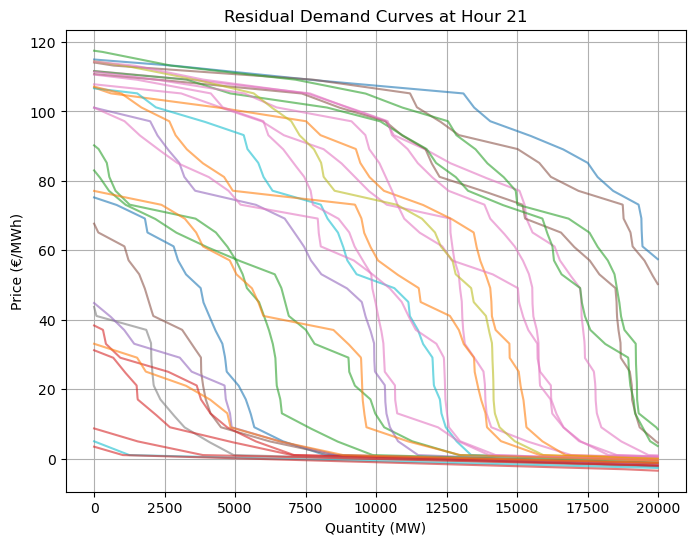

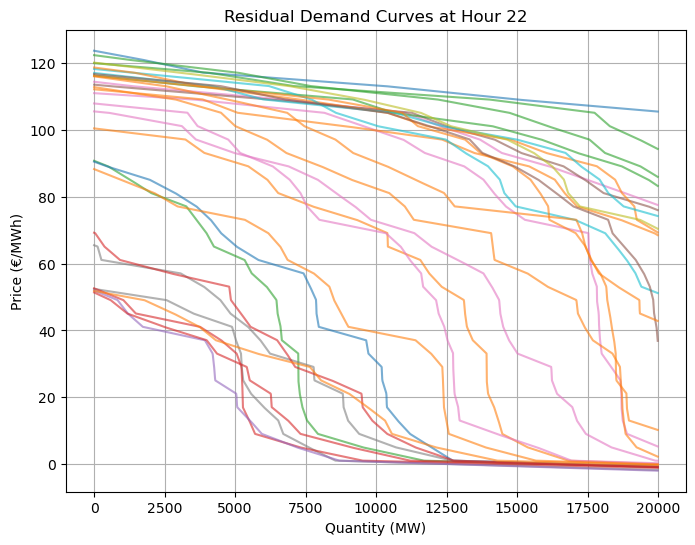

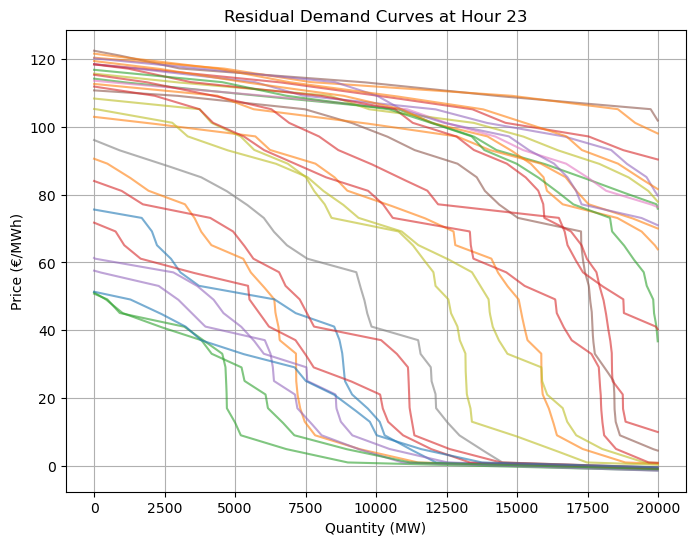

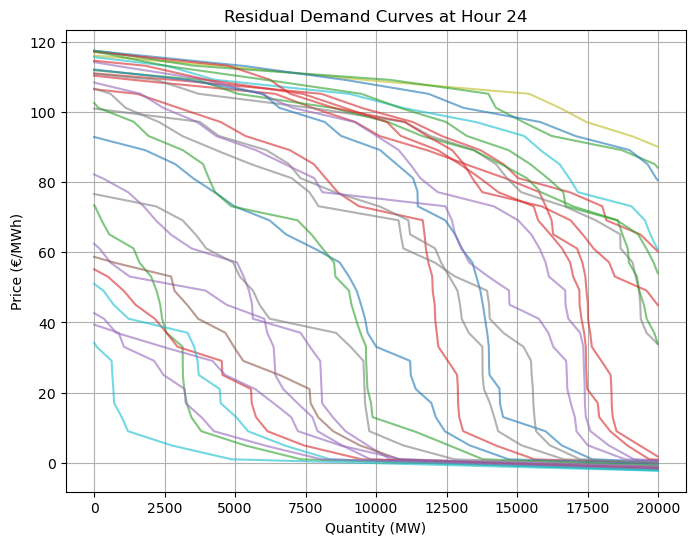

In [15]:
colors = cm.tab10

for h in range(1, 25):  # 1~24
    plt.figure(figsize=(8,6))
    
    for curve in supply_curves:
        cluster = curve["Cluster"]
        if cluster is None:
            continue
        
        # Datetime에서 Hour 추출
        hour = int(curve["Datetime"].split()[-1])
        if hour != h:
            continue
        
        # 공급/수요곡선
        s_agg, d_agg = curve["Supply"], curve["Demand"]
        
        # 계단 보간 함수
        s_f = interp1d(
            s_agg["Price"], s_agg["Cumul"], 
            kind="previous", bounds_error=False,
            fill_value=(0, s_agg["Cumul"].iat[-1])
        )
        d_f = interp1d(
            d_agg["Price"], d_agg["Cumul"], 
            kind="previous", bounds_error=False,
            fill_value=(d_agg["Cumul"].iat[0], 0)
        )
        
        # Price grid
        pg = np.linspace(s_agg["Price"].min(), d_agg["Price"].max(), 500)
        sv, dv = s_f(pg), d_f(pg)
        
        # RDC 계산
        # wf_offer_grid = np.arange(0, s_agg["Cumul"].max() * 1.2, 100)
        wf_offer_grid = np.arange(0, 20000, 10) 

        rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        
        qv, pv = zip(*rdc_pts)
        
        # RDC 플롯 (클러스터 색상 반영)
        plt.plot(qv, pv, "-", color=colors(cluster % 10), alpha=0.6)
    
    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.title(f"Residual Demand Curves at Hour {h}")
    plt.grid(True)
    plt.show()


전체 rdc 확인

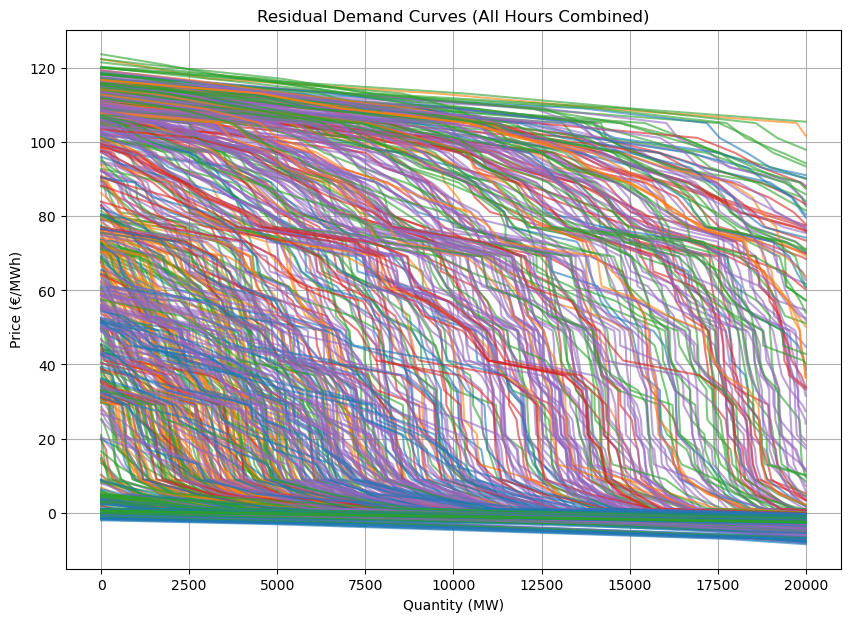

In [68]:
colors = cm.tab10

plt.figure(figsize=(10, 7))

for curve in supply_curves:
    cluster = curve["Cluster"]
    if cluster is None:
        continue

    # 공급/수요곡선
    s_agg, d_agg = curve["Supply"], curve["Demand"]

    # 계단 보간 함수
    s_f = interp1d(
        s_agg["Price"], s_agg["Cumul"], 
        kind="previous", bounds_error=False,
        fill_value=(0, s_agg["Cumul"].iat[-1])
    )
    d_f = interp1d(
        d_agg["Price"], d_agg["Cumul"], 
        kind="previous", bounds_error=False,
        fill_value=(d_agg["Cumul"].iat[0], 0)
    )

    # Price grid
    pg = np.linspace(s_agg["Price"].min(), d_agg["Price"].max(), 500)
    sv, dv = s_f(pg), d_f(pg)

    # RDC 계산
    wf_offer_grid = np.arange(0, 20000, 5)
    rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
    if not rdc_pts:
        continue

    qv, pv = zip(*rdc_pts)

    # 클러스터 색상으로만 구분해서 하나의 그래프에 플로팅
    plt.plot(qv, pv, "-", color=colors(cluster % 10), alpha=0.6)

plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title("Residual Demand Curves (All Hours Combined)")
plt.grid(True)
plt.show()


## 클러스터링기반 KDE 추출

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\3378611016.py:43: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(interp_curves, axis=0)


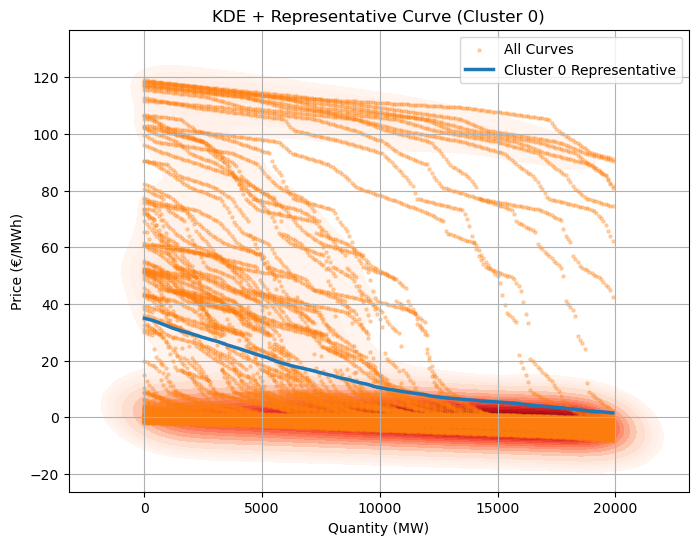

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\3378611016.py:43: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(interp_curves, axis=0)


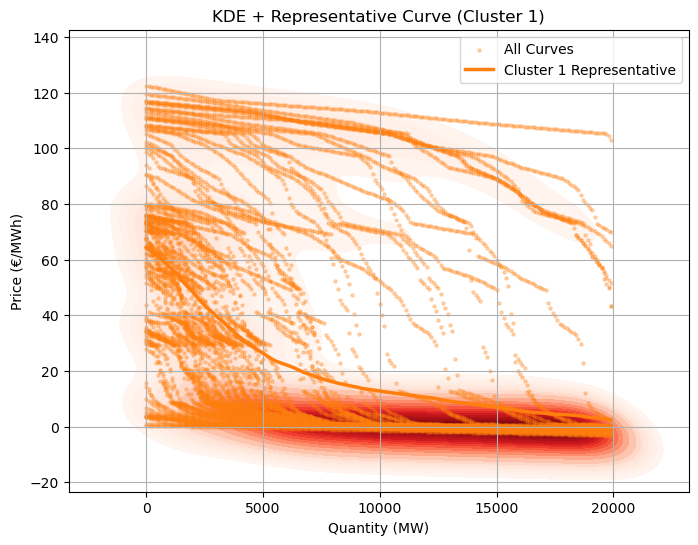

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\3378611016.py:43: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(interp_curves, axis=0)


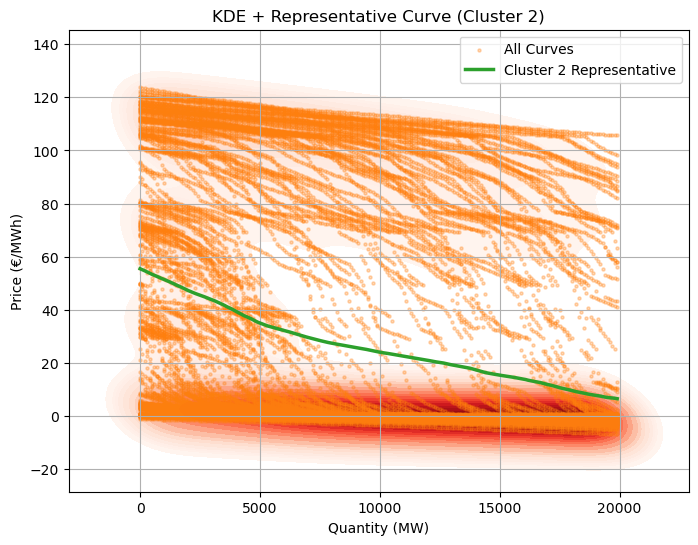

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\3378611016.py:43: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(interp_curves, axis=0)


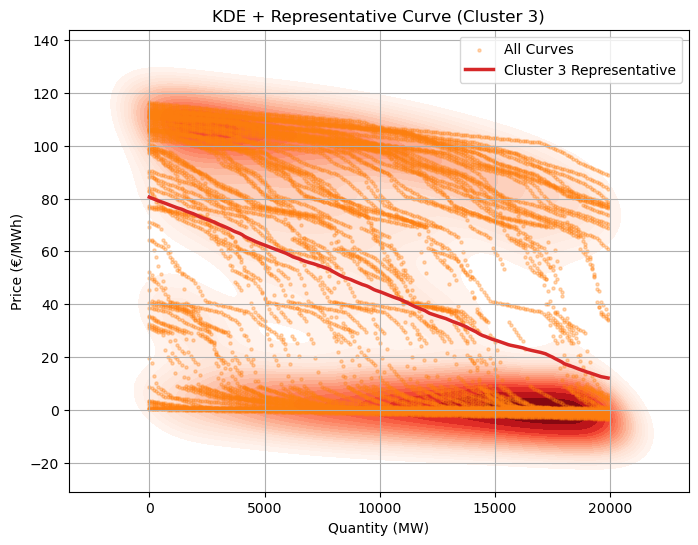

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\3378611016.py:43: RuntimeWarning: Mean of empty slice
  mean_curve = np.nanmean(interp_curves, axis=0)


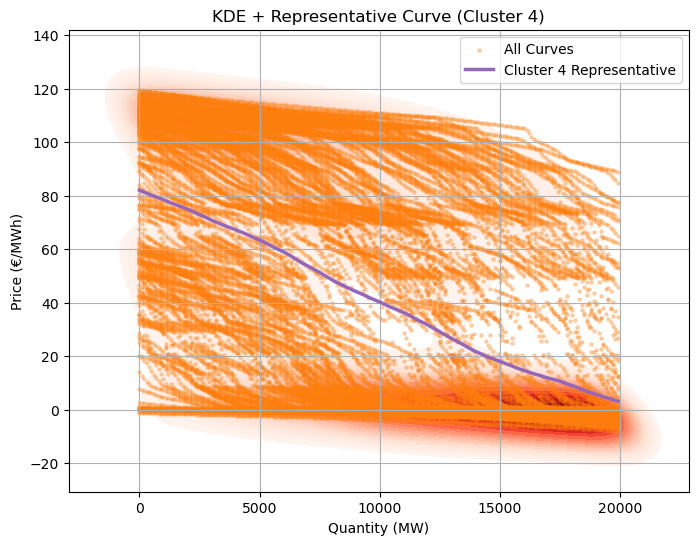

In [ ]:
# RDC를 KDE로
colors = cm.tab10

for c in sorted(set(curve["Cluster"] for curve in supply_curves if curve["Cluster"] is not None)):
    cluster_curves = [curve for curve in supply_curves if curve["Cluster"] == c]

    all_q = []
    all_p = []
    grid_q = np.linspace(0, 20000, 200)  # 공통 quantity grid
    interp_curves = []

    for curve in cluster_curves:
        s_agg, d_agg = curve["Supply"], curve["Demand"]

        # Residual demand 계산
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(0, s_agg["Cumul"].iat[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(d_agg["Cumul"].iat[0], 0))

        pg = np.linspace(s_agg["Price"].min(), d_agg["Price"].max(), 500)
        sv, dv = s_f(pg), d_f(pg)

        wf_offer_grid = np.arange(0, 20000, 100)
        rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue

        qv, pv = zip(*rdc_pts)
        all_q.extend(qv)
        all_p.extend(pv)

        # 보간 후 저장
        interp = np.interp(grid_q, qv, pv, left=np.nan, right=np.nan)
        interp_curves.append(interp)

    # KDE 플롯
    plt.figure(figsize=(8,6))
    sns.kdeplot(x=all_q, y=all_p, fill=True, cmap="Reds", thresh=0.05, levels=20)
    plt.scatter(all_q, all_p, s=5, alpha=0.3, label="All Curves")

    # 대표곡선 = 평균 곡선
    if interp_curves:
        mean_curve = np.nanmean(interp_curves, axis=0)
        plt.plot(grid_q, mean_curve, color=colors(c % 10), linewidth=2.5, label=f"Cluster {c} Representative")

    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.title(f"KDE + Representative Curve (Cluster {c})")
    plt.legend()
    plt.grid(True)
    plt.show()


C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:30: RuntimeWarning: Mean of empty slice
  sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:31: RuntimeWarning: Mean of empty slice
  dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None


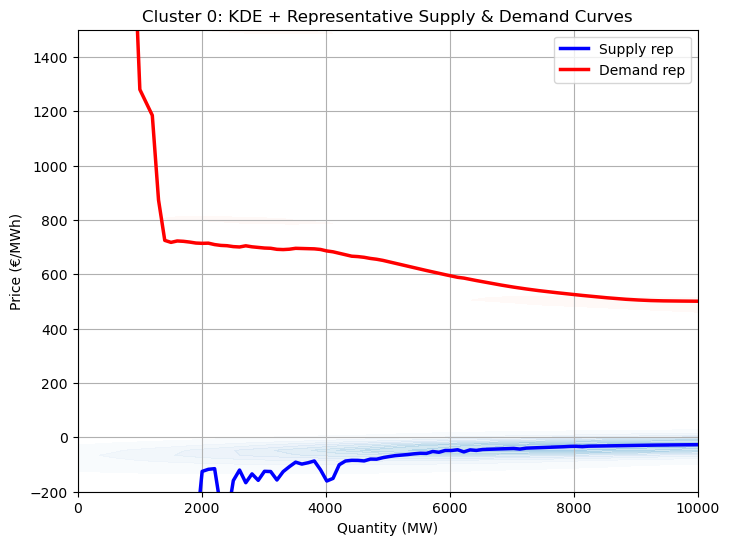

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:30: RuntimeWarning: Mean of empty slice
  sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:31: RuntimeWarning: Mean of empty slice
  dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None


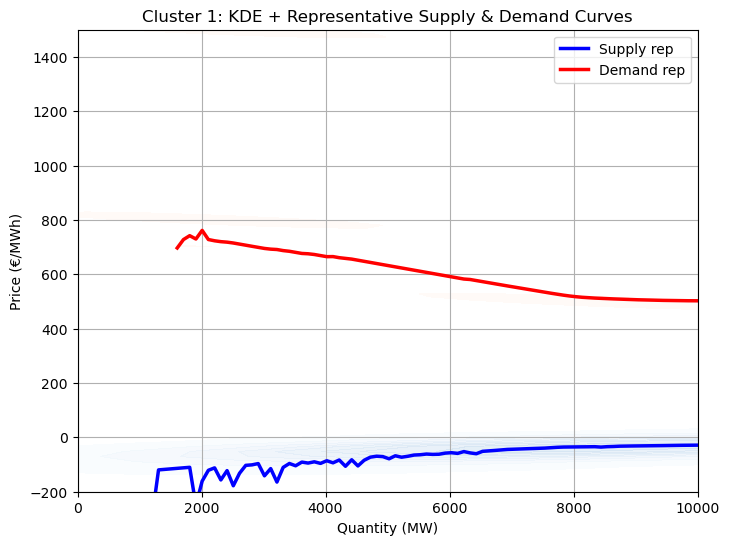

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:30: RuntimeWarning: Mean of empty slice
  sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:31: RuntimeWarning: Mean of empty slice
  dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None


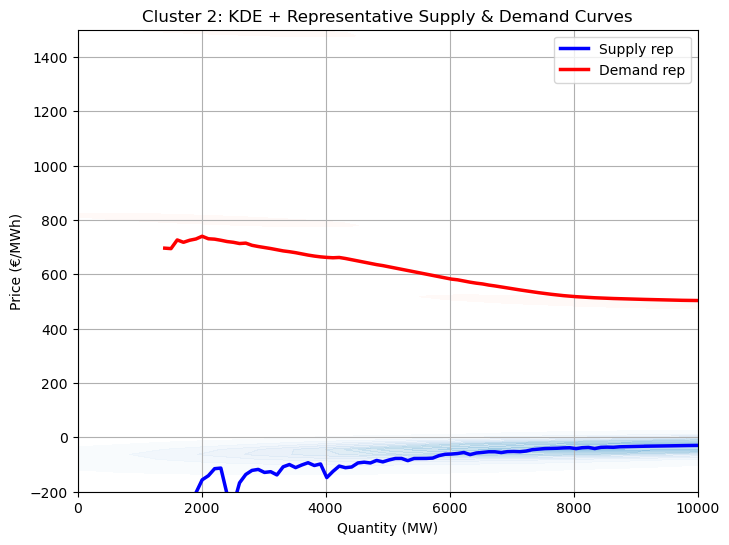

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:30: RuntimeWarning: Mean of empty slice
  sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:31: RuntimeWarning: Mean of empty slice
  dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None


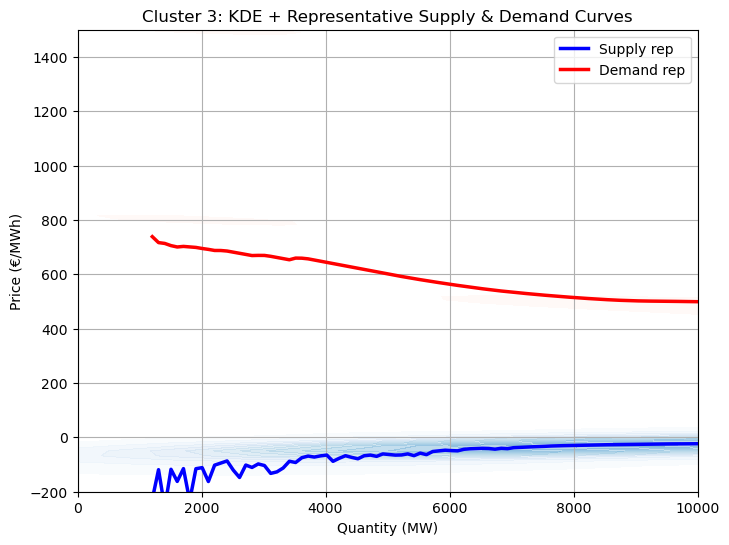

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:30: RuntimeWarning: Mean of empty slice
  sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\2403655982.py:31: RuntimeWarning: Mean of empty slice
  dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None


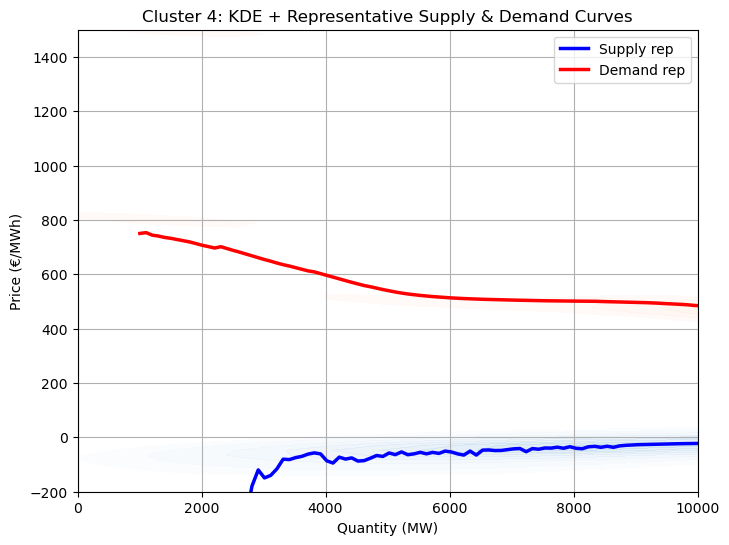

In [76]:
for c in sorted(set(curve["Cluster"] for curve in supply_curves if curve["Cluster"] is not None)):
    cluster_curves = [curve for curve in supply_curves if curve["Cluster"] == c]

    all_sup_q, all_sup_p = [], []
    all_dem_q, all_dem_p = [], []
    grid_q = np.linspace(0, 20000, 200)

    sup_curves, dem_curves = [], []

    for curve in cluster_curves:
        s_agg, d_agg = curve["Supply"], curve["Demand"]

        # 공급곡선 보간 (Q vs P)
        s_q = s_agg["Cumul"].values
        s_p = s_agg["Price"].values
        all_sup_q.extend(s_q); all_sup_p.extend(s_p)

        s_interp = np.interp(grid_q, s_q, s_p, left=np.nan, right=np.nan)
        sup_curves.append(s_interp)

        # 수요곡선 보간 (Q vs P, 뒤집어서 오름차순 맞춤)
        d_q = d_agg["Cumul"].values[::-1]
        d_p = d_agg["Price"].values[::-1]
        all_dem_q.extend(d_q); all_dem_p.extend(d_p)

        d_interp = np.interp(grid_q, d_q, d_p, left=np.nan, right=np.nan)
        dem_curves.append(d_interp)

    # 대표곡선
    sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
    dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None

    # 시각화
    plt.figure(figsize=(8,6))

    # KDE: 공급
    if all_sup_q:
        sns.kdeplot(x=all_sup_q, y=all_sup_p, fill=True, cmap="Blues", 
                    thresh=0.05, levels=20, alpha=0.4, label=None)
    # KDE: 수요
    if all_dem_q:
        sns.kdeplot(x=all_dem_q, y=all_dem_p, fill=True, cmap="Reds", 
                    thresh=0.05, levels=20, alpha=0.4, label=None)

    # 대표곡선: 공급
    if sup_mean is not None:
        plt.plot(grid_q, sup_mean, color="blue", linewidth=2.5, label="Supply rep")

    # 대표곡선: 수요
    if dem_mean is not None:
        plt.plot(grid_q, dem_mean, color="red", linewidth=2.5, label="Demand rep")

    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.title(f"Cluster {c}: KDE + Representative Supply & Demand Curves")
    plt.xlim(0, 10000)   # X축 제한
    plt.ylim(-200, 1500) # Y축 제한
    plt.legend()
    plt.grid(True)
    plt.show()


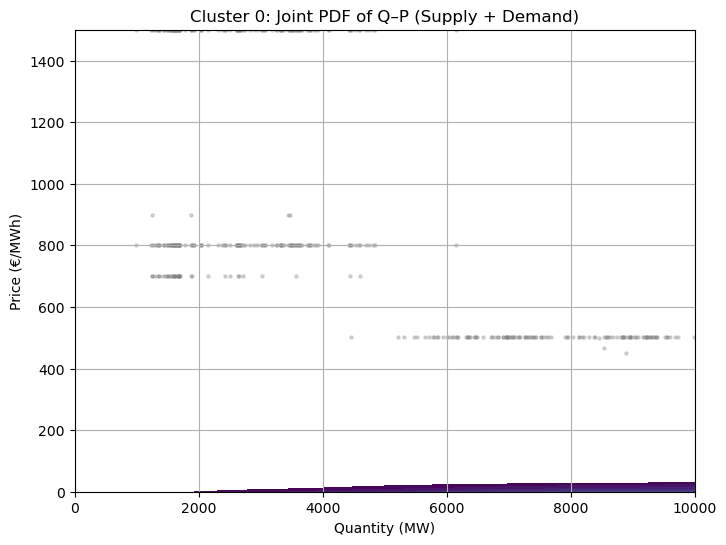

In [77]:
# 예: Cluster 0만 joint PDF 보기
c = 0
cluster_curves = [curve for curve in supply_curves if curve["Cluster"] == c]

all_q, all_p = [], []
for curve in cluster_curves:
    s_agg, d_agg = curve["Supply"], curve["Demand"]
    all_q.extend(s_agg["Cumul"]); all_p.extend(s_agg["Price"])
    all_q.extend(d_agg["Cumul"]); all_p.extend(d_agg["Price"])

plt.figure(figsize=(8,6))
sns.kdeplot(x=all_q, y=all_p, fill=True, cmap="viridis", levels=30, thresh=0.05)
plt.scatter(all_q, all_p, s=5, alpha=0.3, color="gray")
plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Cluster {c}: Joint PDF of Q–P (Supply + Demand)")
plt.xlim(0, 10000)
plt.ylim(0, 1500)
plt.grid(True)
plt.show()


In [79]:
def extract_curves_by_context(df_supply, df_weather, df_forecast,
                              hour=None, weekend=None, cluster=None):
    # 1) contextual filter
    mask = pd.Series(True, index=df_supply.index)

    if hour is not None:
        mask &= df_supply["Hour"] == hour
    if weekend is not None:
        mask &= df_supply["Weekend"] == weekend
    if cluster is not None:
        mask &= df_supply["Cluster"] == cluster

    selected_dates = df_supply.loc[mask, "Datetime"].unique()

    # 2) 곡선 집합 수집
    curves = [curve for curve in supply_curves if curve["Datetime"] in selected_dates]
    return curves

# 예시: context = 오후 18시, 주중, 날씨클러스터 3
curves = extract_curves_by_context(df_supply, df_weather, df_forecast,
                                   hour=18, cluster=3)

# 3) joint pdf (Q,P)
all_q, all_p = [], []
for curve in curves:
    s_agg, d_agg = curve["Supply"], curve["Demand"]
    all_q.extend(s_agg["Cumul"]); all_p.extend(s_agg["Price"])
    all_q.extend(d_agg["Cumul"]); all_p.extend(d_agg["Price"])

plt.figure(figsize=(8,6))
sns.kdeplot(x=all_q, y=all_p, fill=True, cmap="viridis", levels=30, thresh=0.05)
plt.scatter(all_q, all_p, s=5, alpha=0.3, color="gray")
plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title("Joint PDF of Supply & Demand under Context (Hour=18, Weekday, Cluster=3)")
plt.xlim(0,10000); plt.ylim(0,1500)
plt.show()


KeyError: 'Cluster'

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:27: RuntimeWarning: Mean of empty slice
  mean_s = np.nanmean(interp_s, axis=0)
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:28: RuntimeWarning: Mean of empty slice
  mean_d = np.nanmean(interp_d, axis=0)


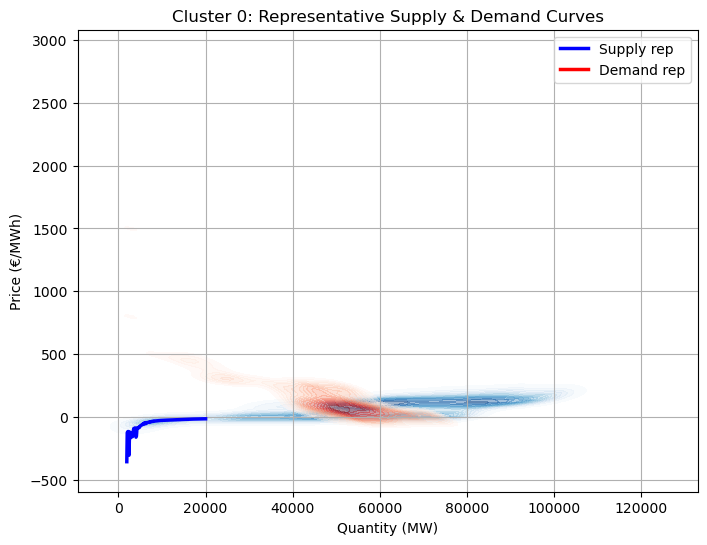

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:27: RuntimeWarning: Mean of empty slice
  mean_s = np.nanmean(interp_s, axis=0)
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:28: RuntimeWarning: Mean of empty slice
  mean_d = np.nanmean(interp_d, axis=0)


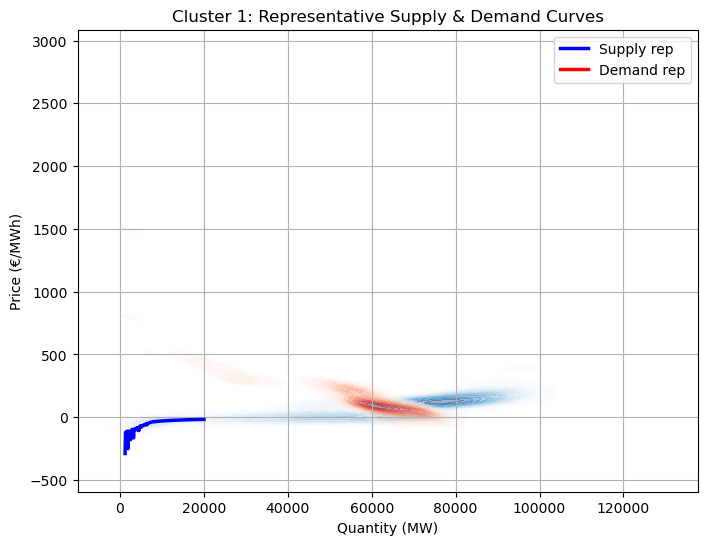

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:27: RuntimeWarning: Mean of empty slice
  mean_s = np.nanmean(interp_s, axis=0)
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:28: RuntimeWarning: Mean of empty slice
  mean_d = np.nanmean(interp_d, axis=0)


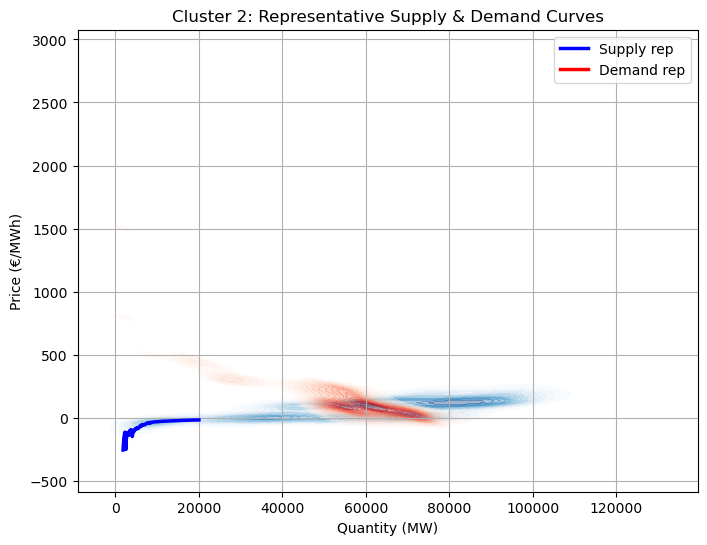

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:27: RuntimeWarning: Mean of empty slice
  mean_s = np.nanmean(interp_s, axis=0)
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:28: RuntimeWarning: Mean of empty slice
  mean_d = np.nanmean(interp_d, axis=0)


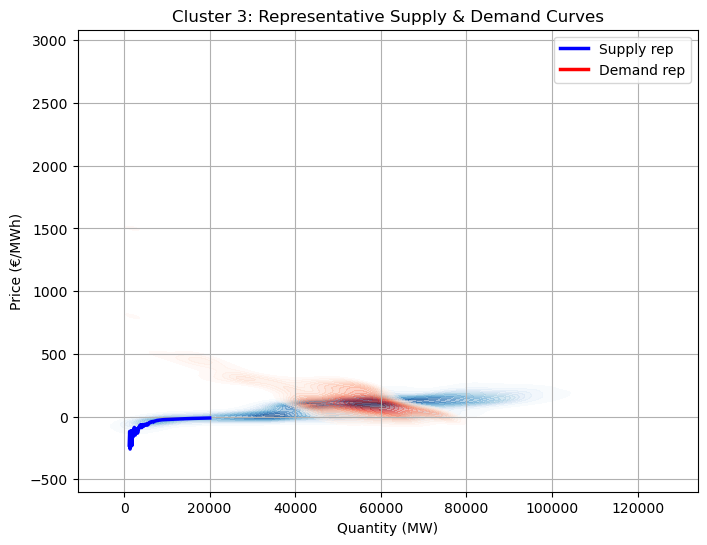

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:27: RuntimeWarning: Mean of empty slice
  mean_s = np.nanmean(interp_s, axis=0)
C:\Users\symply_jina\AppData\Local\Temp\ipykernel_31432\1831805791.py:28: RuntimeWarning: Mean of empty slice
  mean_d = np.nanmean(interp_d, axis=0)


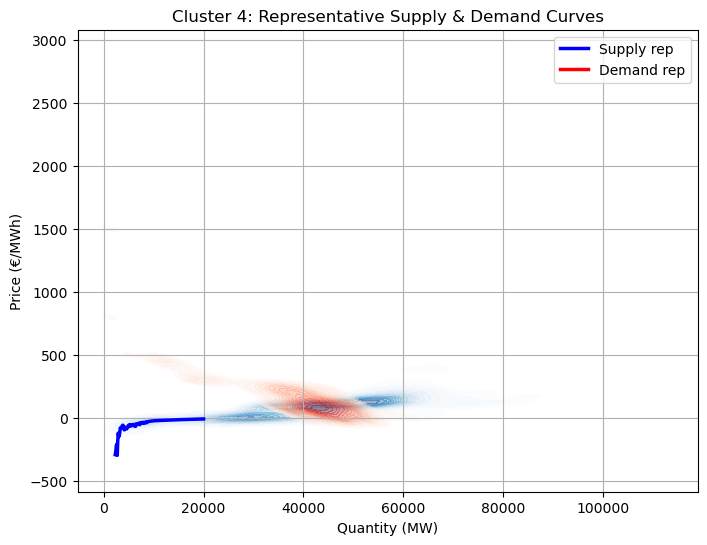

In [75]:
colors = cm.tab10

for c in sorted(set(curve["Cluster"] for curve in supply_curves if curve["Cluster"] is not None)):
    cluster_curves = [curve for curve in supply_curves if curve["Cluster"] == c]

    # 공통 grid
    grid_q = np.linspace(0, 20000, 200)
    interp_s, interp_d = [], []
    all_s_q, all_s_p, all_d_q, all_d_p = [], [], [], []

    for curve in cluster_curves:
        s_agg, d_agg = curve["Supply"], curve["Demand"]

        # 보간
        s_interp = np.interp(grid_q, s_agg["Cumul"], s_agg["Price"], left=np.nan, right=np.nan)
        d_interp = np.interp(grid_q, d_agg["Cumul"], d_agg["Price"], left=np.nan, right=np.nan)

        interp_s.append(s_interp)
        interp_d.append(d_interp)

        all_s_q.extend(s_agg["Cumul"])
        all_s_p.extend(s_agg["Price"])
        all_d_q.extend(d_agg["Cumul"])
        all_d_p.extend(d_agg["Price"])

    # 대표곡선 (평균)
    mean_s = np.nanmean(interp_s, axis=0)
    mean_d = np.nanmean(interp_d, axis=0)

    # 시각화
    plt.figure(figsize=(8,6))
    # KDE
    sns.kdeplot(x=all_s_q, y=all_s_p, cmap="Blues", fill=True, alpha=0.4, thresh=0.05, levels=20)
    sns.kdeplot(x=all_d_q, y=all_d_p, cmap="Reds", fill=True, alpha=0.4, thresh=0.05, levels=20)

    # 대표곡선
    plt.plot(grid_q, mean_s, color="blue", linewidth=2.5, label="Supply rep")
    plt.plot(grid_q, mean_d, color="red", linewidth=2.5, label="Demand rep")

    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.title(f"Cluster {c}: Representative Supply & Demand Curves")
    plt.legend()
    plt.grid(True)
    plt.show()


### RDC 보기

C:\Users\symply_jina\AppData\Local\Temp\ipykernel_35248\3217724969.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab20", len(days))


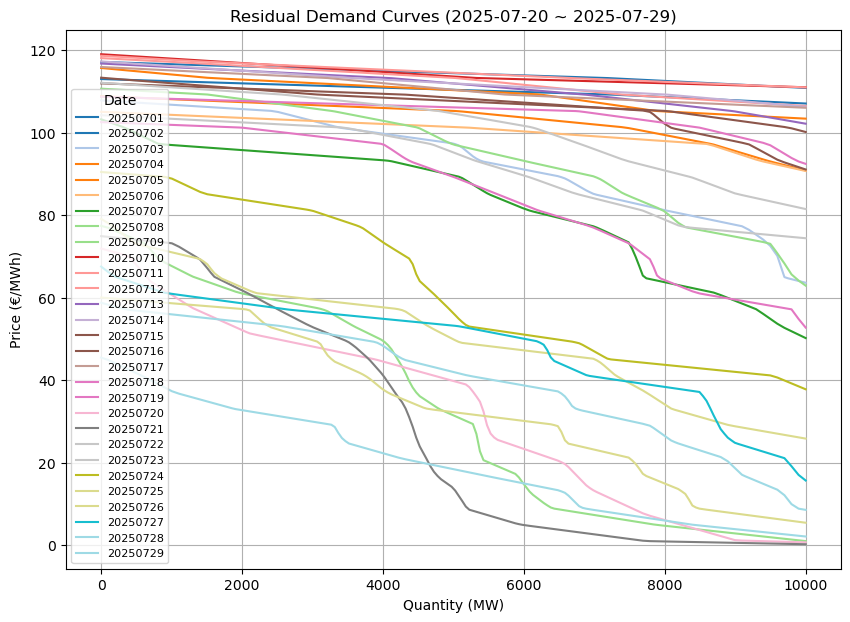

In [18]:
days = list(range(1, 30))
colors = cm.get_cmap("tab20", len(days)) 
plt.figure(figsize=(10,7))

# 날짜 루프 (2025-07-20 ~ 2025-07-29)
for i, day in enumerate(days):
    date_str = f"202507{day:02d}"
    
    # 그 날짜에 해당하는 curves만 선택
    daily_curves = [curve for curve in supply_curves if curve["Datetime"].startswith(date_str)]
    if not daily_curves:
        continue

    all_q, all_p = [], []
    for curve in daily_curves:
        s_agg, d_agg = curve["Supply"], curve["Demand"]

        # 보간 함수
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(0, s_agg["Cumul"].iat[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(d_agg["Cumul"].iat[0], 0))

        pg = np.linspace(s_agg["Price"].min(), d_agg["Price"].max(), 500)
        sv, dv = s_f(pg), d_f(pg)

        wf_offer_grid = np.arange(0, 20000, 100)
        rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue

        qv, pv = zip(*rdc_pts)
        all_q.extend(qv); all_p.extend(pv)

    # 하루 RDC 대표 (평균 커브)
    if all_q:
        # 같은 grid에 맞춰 평균
        grid_q = np.linspace(0, 10000, 200)
        interp = np.interp(grid_q, all_q, all_p, left=np.nan, right=np.nan)
        plt.plot(grid_q, interp, "-", color=colors(i), label=date_str)

plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title("Residual Demand Curves (2025-07-20 ~ 2025-07-29)")
plt.legend(title="Date", fontsize=8)
# plt.xlim(0, 10000)
# plt.ylim(0, 1500)
plt.grid(True)
plt.show()


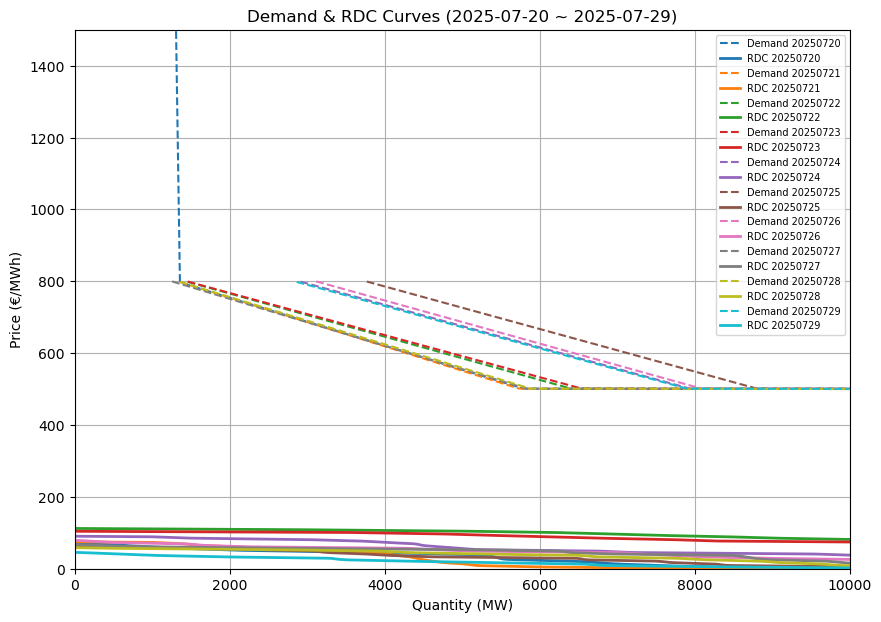

In [ ]:
colors = plt.cm.tab10(np.linspace(0,1,10))  # 10일치 색상

plt.figure(figsize=(10,7))

for i, day in enumerate(range(20, 30)):
    date_str = f"202507{day:02d}"
    
    # 해당 날짜 curve 모으기
    daily_curves = [curve for curve in supply_curves if curve["Datetime"].startswith(date_str)]
    if not daily_curves:
        continue

    # RDC용 점
    all_q_rdc, all_p_rdc = [], []
    # Demand곡선용 점
    all_q_dem, all_p_dem = [], []

    for curve in daily_curves:
        s_agg, d_agg = curve["Supply"], curve["Demand"]

        # --- Demand Curve (그날 대표 수요곡선) ---
        dem_q = d_agg["Cumul"].values[::-1]   # 증가 순서로 맞춤
        dem_p = d_agg["Price"].values[::-1]
        all_q_dem.extend(dem_q)
        all_p_dem.extend(dem_p)

        # --- RDC ---
        s_f = interp1d(s_agg["Price"], s_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(0, s_agg["Cumul"].iat[-1]))
        d_f = interp1d(d_agg["Price"], d_agg["Cumul"], kind="previous",
                       bounds_error=False, fill_value=(d_agg["Cumul"].iat[0], 0))

        pg = np.linspace(s_agg["Price"].min(), d_agg["Price"].max(), 500)
        sv, dv = s_f(pg), d_f(pg)

        wf_offer_grid = np.arange(0, 20000, 100)
        rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue

        qv, pv = zip(*rdc_pts)
        all_q_rdc.extend(qv); all_p_rdc.extend(pv)

    # --- 대표 Demand Curve (평균) ---
    if all_q_dem:
        grid_q = np.linspace(0, 10000, 200)
        dem_interp = np.interp(grid_q, all_q_dem, all_p_dem, left=np.nan, right=np.nan)
        plt.plot(grid_q, dem_interp, "--", color=colors[i % 10], linewidth=1.5,
                 label=f"Demand {date_str}")

    # --- 대표 RDC Curve (평균) ---
    if all_q_rdc:
        grid_q = np.linspace(0, 10000, 200)
        rdc_interp = np.interp(grid_q, all_q_rdc, all_p_rdc, left=np.nan, right=np.nan)
        plt.plot(grid_q, rdc_interp, "-", color=colors[i % 10], linewidth=2,
                 label=f"RDC {date_str}")

plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title("Demand & RDC Curves (2025-07-20 ~ 2025-07-29)")
plt.legend(fontsize=7)
plt.xlim(0, 10000)
plt.ylim(0, 1500)
plt.grid(True)
plt.show()


### 괜찮은 시도 1

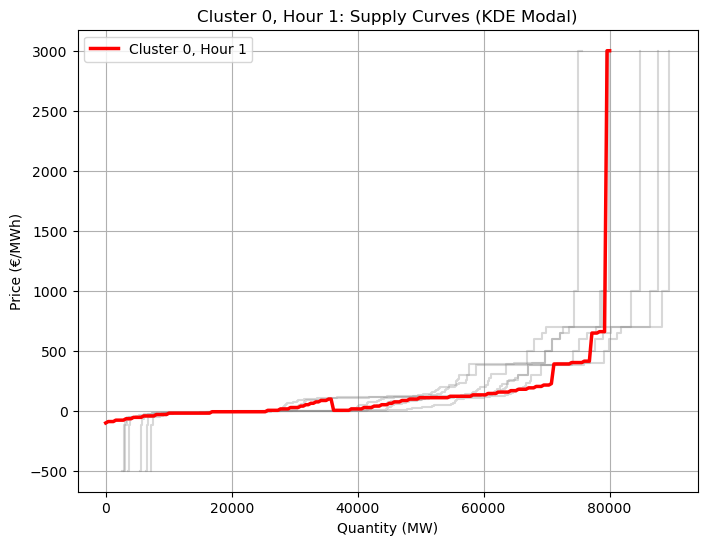

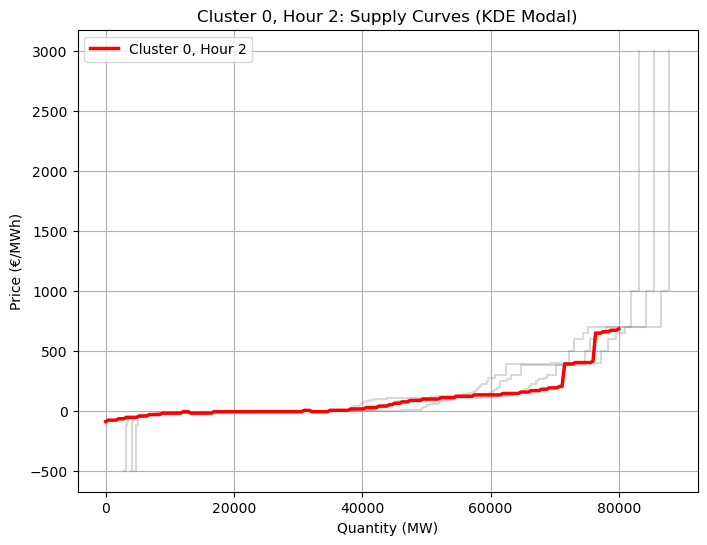

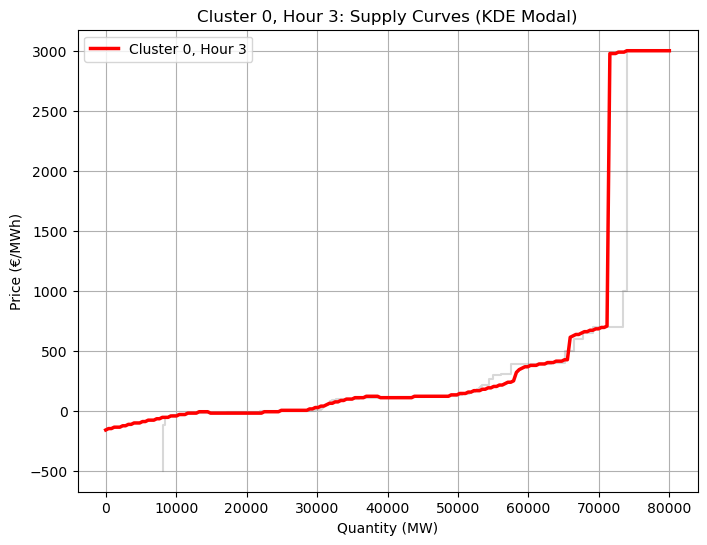

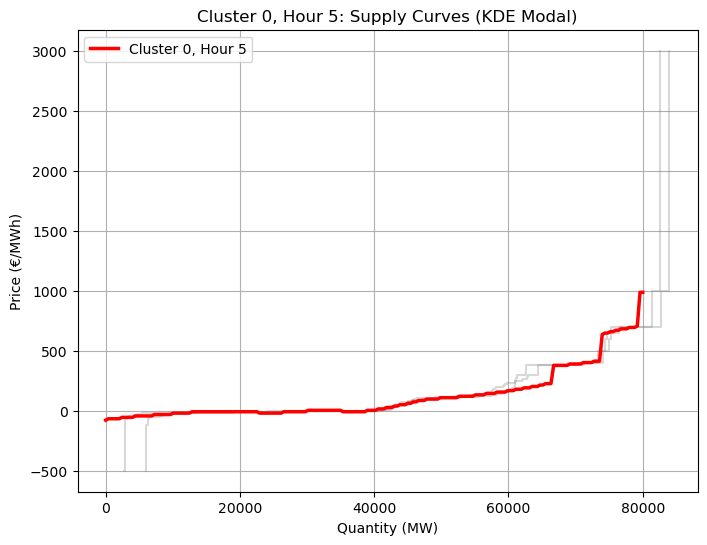

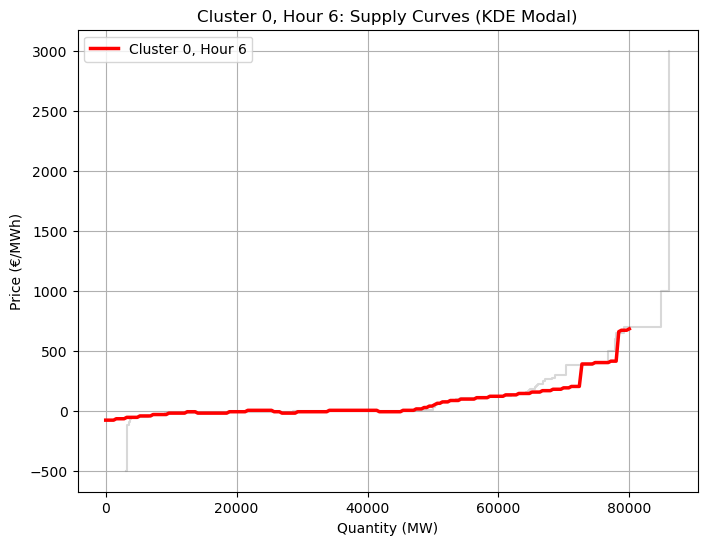

...

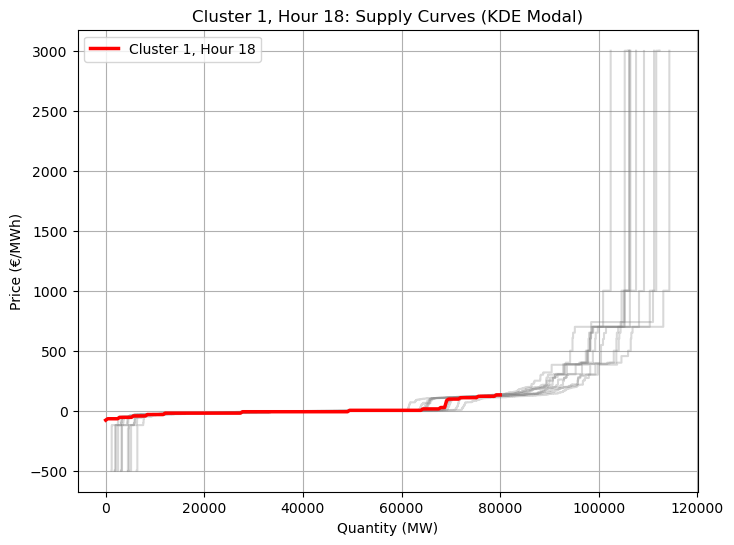

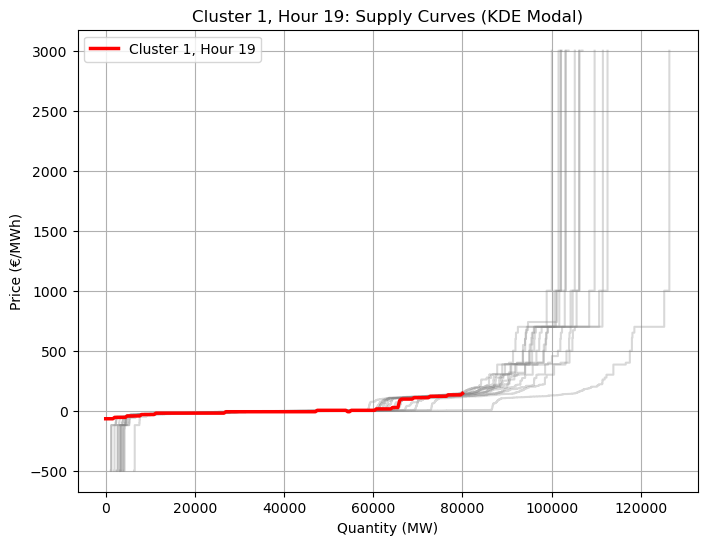

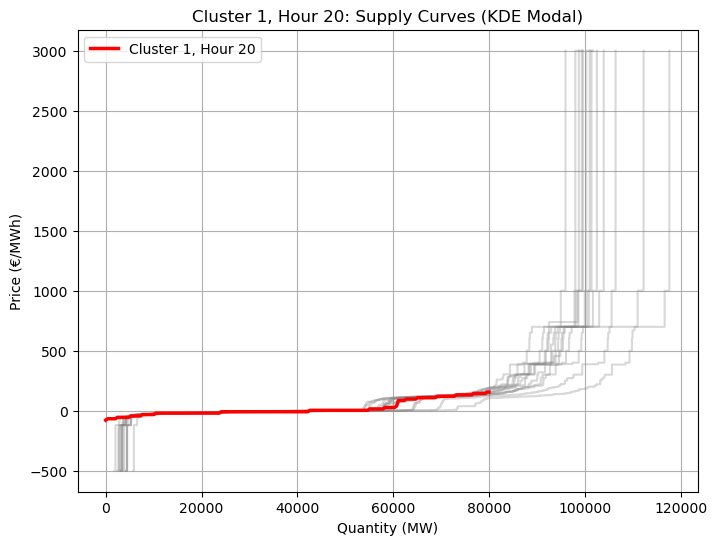

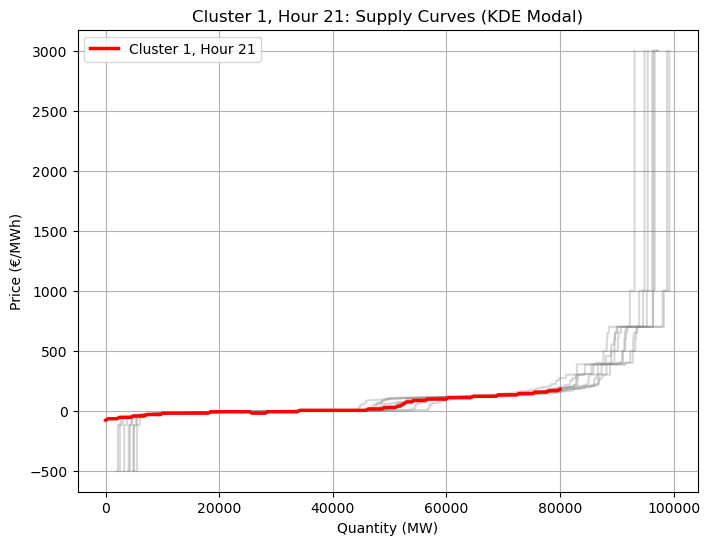

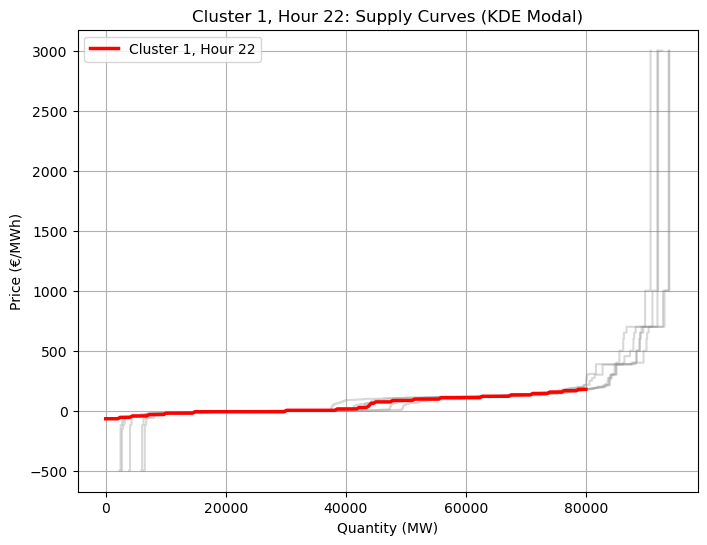

KeyboardInterrupt: 

In [25]:
def kde_modal_curve_from_cluster(cluster_curves, q_grid, bw=0.2):
    """한 클러스터 안의 공급곡선 모아서 modal curve 추출"""
    all_q, all_p = [], []

    for curve in cluster_curves:
        s_agg = curve["Supply"]
        all_q.extend(s_agg["Cumul"].values)
        all_p.extend(s_agg["Price"].values)

    if not all_q:
        return None

    values = np.vstack([all_q, all_p])   # (2, N)
    kde = gaussian_kde(values, bw_method=bw)

    # modal curve
    modal_p = []
    p_grid = np.linspace(min(all_p), max(all_p), 300)
    for q in q_grid:
        pts = np.vstack([np.full_like(p_grid, q), p_grid])
        dens = kde(pts)
        modal_p.append(p_grid[np.argmax(dens)])

    return np.array(modal_p)

# --------------------
# 실행
q_grid = np.linspace(0, 80000, 200)
clusters = sorted(set(c["Cluster"] for c in supply_curves if c["Cluster"] is not None))

for c in clusters:
    for h in range(1, 25):   # 1~24시
        cluster_curves = [curve for curve in supply_curves 
                          if curve["Cluster"] == c and int(curve["Datetime"].split()[-1]) == h]
        if not cluster_curves:
            continue

        modal_curve = kde_modal_curve_from_cluster(cluster_curves, q_grid, bw=0.2)
        if modal_curve is None:
            continue

        plt.figure(figsize=(8,6))

        # raw curves
        for curve in cluster_curves:
            s_agg = curve["Supply"]
            plt.step(s_agg["Cumul"], s_agg["Price"], where="post",
                     color="gray", alpha=0.3)

        # modal curve
        plt.plot(q_grid, modal_curve, color="red", lw=2.5,
                 label=f"Cluster {c}, Hour {h}")

        plt.xlabel("Quantity (MW)")
        plt.ylabel("Price (€/MWh)")
        plt.title(f"Cluster {c}, Hour {h}: Supply Curves (KDE Modal)")
        plt.legend()
        plt.grid(True)
        plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

for c in sorted(set(curve["Cluster"] for curve in supply_curves if curve["Cluster"] is not None)):
    cluster_curves = [curve for curve in supply_curves if curve["Cluster"] == c]

    for h in range(1, 25):  # 1~24시
        hour_curves = [curve for curve in cluster_curves if int(curve["Datetime"].split()[-1]) == h]
        if not hour_curves:
            continue

        sup_curves, dem_curves = [], []
        grid_q = np.linspace(0, max(max(c["Supply"]["Cumul"].max(), c["Demand"]["Cumul"].max()) for c in hour_curves), 500)

        for curve in hour_curves:
            # 공급
            s_q, s_p = curve["Supply"]["Cumul"].values, curve["Supply"]["Price"].values
            s_interp = np.interp(grid_q, s_q, s_p, left=s_p.min(), right=s_p.max())
            sup_curves.append(s_interp)

            # 수요
            d_q, d_p = curve["Demand"]["Cumul"].values, curve["Demand"]["Price"].values
            d_interp = np.interp(grid_q, d_q, d_p, left=d_p.min(), right=d_p.max())
            dem_curves.append(d_interp)

        # 대표곡선
        sup_mean = np.nanmean(sup_curves, axis=0) if sup_curves else None
        dem_mean = np.nanmean(dem_curves, axis=0) if dem_curves else None
        rdc_mean = dem_mean - sup_mean if sup_mean is not None and dem_mean is not None else None

        # 시각화
        plt.figure(figsize=(8,6))
        if sup_mean is not None:
            plt.plot(grid_q, sup_mean, color="blue", label="Supply rep")
        if dem_mean is not None:
            plt.plot(grid_q, dem_mean, color="red", label="Demand rep")
        if rdc_mean is not None:
            plt.plot(grid_q, rdc_mean, color="green", label="RDC rep")

        plt.xlabel("Quantity (MW)")
        plt.ylabel("Price (€/MWh)")
        plt.title(f"Cluster {c}, Hour {h}: Representative Curves (S/D & RDC)")
        plt.legend()
        plt.grid(True)
        plt.show()
